均线 一

In [1]:
import pandas as pd
from datetime import datetime
import trdb2py

isStaticImg = False
width = 960
height = 768

pd.options.display.max_columns = None
pd.options.display.max_rows = None

trdb2cfg = trdb2py.loadConfig('./trdb2.yaml')

In [2]:
# 具体基金
# asset = 'jrj.510310'
asset = 'jqdata.000300_XSHG|1d'

# 起始时间，0表示从最开始算起
# tsStart = 0
tsStart = int(trdb2py.str2timestamp('2013-05-01', '%Y-%m-%d'))

# 结束时间，-1表示到现在为止
# tsEnd = -1
tsEnd = int(trdb2py.str2timestamp('2020-09-30', '%Y-%m-%d'))

# 初始资金池
paramsinit = trdb2py.trading2_pb2.InitParams(
    money=10000,
)

# 买入参数，用全部的钱来买入（也就是复利）
paramsbuy = trdb2py.trading2_pb2.BuyParams(
    perHandMoney=1,
)

# 卖出参数，全部卖出
paramssell = trdb2py.trading2_pb2.SellParams(
    perVolume=1,
)

In [3]:
# baseline    
s0 = trdb2py.trading2_pb2.Strategy(
    name="normal",
    asset=trdb2py.str2asset(asset),         
)
        
buy0 = trdb2py.trading2_pb2.CtrlCondition(
    name='buyandhold',
)

paramsbuy = trdb2py.trading2_pb2.BuyParams(
    perHandMoney=1,
)

paramsinit = trdb2py.trading2_pb2.InitParams(
    money=10000,
)

s0.buy.extend([buy0])
s0.paramsBuy.CopyFrom(paramsbuy)
s0.paramsInit.CopyFrom(paramsinit)        
p0 = trdb2py.trading2_pb2.SimTradingParams(
    assets=[trdb2py.str2asset(asset)],
    startTs=tsStart,
    endTs=tsEnd,
    strategies=[s0],
    title='沪深300指数',
)  

pnlBaseline = trdb2py.simTrading(trdb2cfg, p0)

In [4]:
ret = trdb2py.getAssetCandles2(trdb2cfg, asset, tsStart, tsEnd, indicators=['sma.2', 'sma.5', 'sma.30', 'sma.60'])
trdb2py.showAssetCandles2('沪深300指数', ret, indicators=['sma.2', 'sma.5', 'sma.30', 'sma.60'], toImg=isStaticImg, width=width, height=height)

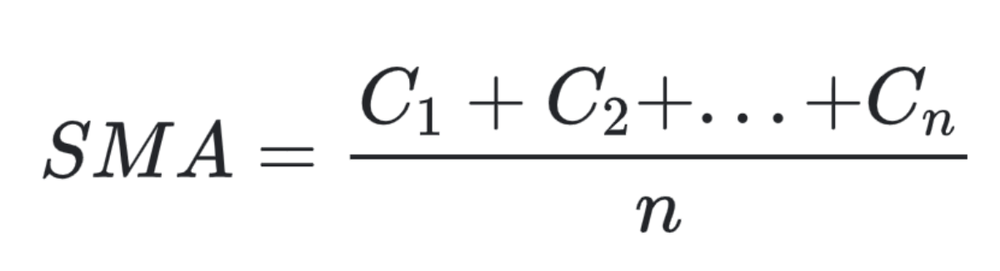

In [5]:
trdb2py.showPNL(pnlBaseline, toImg=isStaticImg, width=width, height=height)

In [17]:
ret = trdb2py.getAssetCandles2(trdb2cfg, asset, tsStart, tsEnd, indicators=['sma.2', 'sma.5', 'sma.30', 'sma.60'])
trdb2py.showAssetCandles2('沪深300指数', ret, indicators=['sma.2', 'sma.5', 'sma.30', 'sma.60'], toImg=isStaticImg, width=width, height=height)

_InactiveRpcError: <_InactiveRpcError of RPC that terminated with:
	status = StatusCode.UNAVAILABLE
	details = "Socket closed"
	debug_error_string = "{"created":"@1613916217.657248000","description":"Error received from peer ipv4:47.244.154.38:5002","file":"src/core/lib/surface/call.cc","file_line":1067,"grpc_message":"Socket closed","grpc_status":14}"
>

In [7]:
lstparams = []

# 具体基金
# asset = 'jrj.510310'
asset = 'jqdata.000300_XSHG|1d'

# 起始时间，0表示从最开始算起
# tsStart = 0
tsStart = int(trdb2py.str2timestamp('2013-05-01', '%Y-%m-%d'))

# 结束时间，-1表示到现在为止
# tsEnd = -1
tsEnd = int(trdb2py.str2timestamp('2020-09-30', '%Y-%m-%d'))

for ema in range(2, 61):    
    buy0 = trdb2py.trading2_pb2.CtrlCondition(
        name='indicatorsp',
        operators=['upcross'],
        strVals=['ta-sma.{}'.format(ema)],
    )
    
    buy1 = trdb2py.trading2_pb2.CtrlCondition(
        name='waittostart',
        vals=[ema],
    )    
            
    sell0 = trdb2py.trading2_pb2.CtrlCondition(
        name='indicatorsp',
        operators=['downcross'],
        strVals=['ta-sma.{}'.format(ema)],
    )
    
    s0 = trdb2py.trading2_pb2.Strategy(
        name="normal",
        asset=trdb2py.str2asset(asset),
    )

    s0.buy.extend([buy0, buy1])
    s0.sell.extend([sell0])
    s0.paramsBuy.CopyFrom(paramsbuy)
    s0.paramsSell.CopyFrom(paramssell) 
    s0.paramsInit.CopyFrom(paramsinit)        
    lstparams.append(trdb2py.trading2_pb2.SimTradingParams(
        assets=[trdb2py.str2asset(asset)],
        startTs=tsStart,
        endTs=tsEnd,
        strategies=[s0],
        title='sma.{}'.format(ema),
    ))
 
lstpnlmix = trdb2py.simTradings(trdb2cfg, lstparams, ignoreTotalReturn=2.3)

In [8]:
trdb2py.showPNLs(lstpnlmix + [pnlBaseline], toImg=isStaticImg, width=width, height=height)

In [9]:
dfpnl = trdb2py.buildPNLReport(lstpnlmix + [pnlBaseline])

dfpnl[['title', 'maxDrawdown', 'maxDrawdownStart', 'maxDrawdownEnd', 'totalReturns', 'sharpe', 'annualizedReturns', 'annualizedVolatility', 'variance']].sort_values(by='totalReturns', ascending=False)

,title,maxDrawdown,maxDrawdownStart,maxDrawdownEnd,totalReturns,sharpe,annualizedReturns,annualizedVolatility,variance
2,sma.42,0.205037,2019-04-19,2020-05-22,2.377462,1.034221,0.185691,0.150539,0.210880
0,sma.35,0.258460,2015-06-08,2016-06-27,2.359716,1.006630,0.183299,0.152289,0.177686
1,sma.41,0.213162,2017-11-22,2019-01-23,2.308137,0.974971,0.176346,0.150102,0.182823
3,sma.2,0.338487,2015-06-08,2016-03-01,2.295215,0.895708,0.174604,0.161440,0.117634
37,sma.37,0.207975,2017-11-22,2019-01-17,2.285312,0.948807,0.173269,0.150999,0.178809
44,sma.46,0.205666,2017-11-22,2019-01-23,2.272987,0.924363,0.171607,0.153194,0.168356
35,sma.34,0.269154,2015-06-08,2016-06-27,2.272639,0.929693,0.171560,0.152265,0.163669
42,sma.44,0.196864,2017-11-22,2019-01-23,2.261923,0.914687,0.170116,0.153184,0.167847
43,sma.45,0.205815,2017-11-22,2019-01-23,2.255489,0.908689,0.169248,0.153241,0.163228
17,sma.16,0.235826,2015-06-08,2016-06-28,2.225247,0.889481,0.165171,0.151967,0.127952


In [10]:
# lstems = [2, 42, 60]
# 起始时间，0表示从最开始算起
tsStart = 0
# tsStart = int(trdb2py.str2timestamp('2013-05-01', '%Y-%m-%d'))

# 结束时间，-1表示到现在为止
tsEnd = -1
# tsEnd = int(trdb2py.str2timestamp('2020-09-30', '%Y-%m-%d'))

# baseline    
s0 = trdb2py.trading2_pb2.Strategy(
    name="normal",
    asset=trdb2py.str2asset(asset),         
)
        
buy0 = trdb2py.trading2_pb2.CtrlCondition(
    name='buyandhold',
)

paramsbuy = trdb2py.trading2_pb2.BuyParams(
    perHandMoney=1,
)

paramsinit = trdb2py.trading2_pb2.InitParams(
    money=10000,
)

s0.buy.extend([buy0])
s0.paramsBuy.CopyFrom(paramsbuy)
s0.paramsInit.CopyFrom(paramsinit)        
p0 = trdb2py.trading2_pb2.SimTradingParams(
    assets=[trdb2py.str2asset(asset)],
    startTs=tsStart,
    endTs=tsEnd,
    strategies=[s0],
    title='baseline',
)  

pnlBaselineF = trdb2py.simTrading(trdb2cfg, p0)

In [11]:
trdb2py.showPNL(pnlBaselineF, toImg=isStaticImg, width=width, height=height)

In [12]:
lstparams = []

lstems = [2, 35, 42, 60]
# 起始时间，0表示从最开始算起
tsStart = 0
# tsStart = int(trdb2py.str2timestamp('2013-05-01', '%Y-%m-%d'))

# 结束时间，-1表示到现在为止
tsEnd = -1
# tsEnd = int(trdb2py.str2timestamp('2020-09-30', '%Y-%m-%d'))

for ema in lstems:    
    buy0 = trdb2py.trading2_pb2.CtrlCondition(
        name='indicatorsp',
        operators=['upcross'],
        strVals=['ta-sma.{}'.format(ema)],
    )
    
    buy1 = trdb2py.trading2_pb2.CtrlCondition(
        name='waittostart',
        vals=[ema],
    )    
            
    sell0 = trdb2py.trading2_pb2.CtrlCondition(
        name='indicatorsp',
        operators=['downcross'],
        strVals=['ta-sma.{}'.format(ema)],
    )
    
    s0 = trdb2py.trading2_pb2.Strategy(
        name="normal",
        asset=trdb2py.str2asset(asset),
    )

    s0.buy.extend([buy0, buy1])
    s0.sell.extend([sell0])
    s0.paramsBuy.CopyFrom(paramsbuy)
    s0.paramsSell.CopyFrom(paramssell) 
    s0.paramsInit.CopyFrom(paramsinit)        
    lstparams.append(trdb2py.trading2_pb2.SimTradingParams(
        assets=[trdb2py.str2asset(asset)],
        startTs=tsStart,
        endTs=tsEnd,
        strategies=[s0],
        title='sma.{}'.format(ema),
    ))
 
lstpnlmix = trdb2py.simTradings(trdb2cfg, lstparams, ignoreTotalReturn=2.3)

In [13]:
trdb2py.showPNLs(lstpnlmix + [pnlBaselineF], toImg=isStaticImg, width=width, height=height)

In [14]:
dfpnl = trdb2py.buildPNLReport(lstpnlmix + [pnlBaselineF])

dfpnl[['title', 'maxDrawdown', 'maxDrawdownStart', 'maxDrawdownEnd', 'totalReturns', 'sharpe', 'annualizedReturns', 'annualizedVolatility', 'variance']].sort_values(by='totalReturns', ascending=False)

,title,maxDrawdown,maxDrawdownStart,maxDrawdownEnd,totalReturns,sharpe,annualizedReturns,annualizedVolatility,variance
2,sma.42,0.317224,2008-01-14,2009-01-15,18.853304,6.173806,1.115831,0.175877,28.218082
1,sma.35,0.276939,2008-01-14,2008-11-28,14.077395,4.450345,0.817337,0.176916,13.685123
3,sma.60,0.411195,2009-08-03,2012-12-13,11.943425,3.683646,0.683964,0.177532,11.890634
4,baseline,0.723038,2007-10-16,2008-11-04,5.131249,0.856241,0.258269,0.266595,1.128936
0,sma.2,0.424350,2008-01-14,2008-11-07,4.653762,1.051189,0.228360,0.188701,0.921770
